# Movie Result Aggregation
- Prepare DFs
- Plots for single models
- Comparisons

In [1]:
import polars as pl
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from pathlib import Path

In [2]:
movie_dirs = {
    "fv": Path('../evaluation/pixabay_v3/movies'),
    "raf": Path('../evaluation/raf_db/movies')
}

In [3]:
def quick_df_eval(df_dict):
    for name, df in df_dict.items():
        print(f'Model name: {name}')
        print(f'df shape: {df.shape}')
        print(f'column names: {(", ").join(df.columns)}')
        print(f'First 5 rows of data:')
        print(df.head())

In [4]:
def concat_all_movies(movie_dir, save_name=None):
    movie_files = list(movie_dir.glob("*.parquet"))
    
    # Read and concat all movies
    all_movies = pl.concat([
        pl.read_parquet(f) for f in movie_files 
        if f.name != "combined_results.parquet"  # Skip if it exists
    ])

    all_movies = all_movies.with_columns([
        pl.when(pl.col('relative_face_area') < 0.05).then(pl.lit('tiny'))
        .when(pl.col('relative_face_area') < 0.15).then(pl.lit('small'))
        .when(pl.col('relative_face_area') < 0.30).then(pl.lit('medium'))
        .otherwise(pl.lit('large'))
        .alias('face_size_category')
    ])

    if save_name:
        parent_dir = movie_dir.parent
        out_path = parent_dir / save_name
        all_movies.write_parquet(out_path)
    
    return all_movies

In [5]:
def model_summary(df):
    summary = df.select([
        pl.col('face_area').mean().alias('face_area_mean'),
        pl.col('face_area').median().alias('face_area_median'),
        pl.col('face_area').std().alias('face_area_std'),
        pl.col('face_area').min().alias('face_area_min'),
        pl.col('face_area').max().alias('face_area_max'),
        
        pl.col('relative_face_area').mean().alias('rel_face_area_mean'),
        pl.col('relative_face_area').median().alias('rel_face_area_median'),
        
        pl.col('confidence').mean().alias('confidence_mean'),
        pl.col('confidence').median().alias('confidence_median'),
        pl.col('confidence').std().alias('confidence_std'),
        pl.col('confidence').min().alias('confidence_min'),
        
        pl.len().alias('total_frames')
    ])

    return summary    

In [6]:
def movie_summary(df):
    movie_summary = df.group_by('movie').agg([
        pl.len().alias('frames_analyzed'),
        pl.col('face_area').mean().alias('avg_face_area'),
        pl.col('relative_face_area').mean().alias('avg_rel_face_area'),
        pl.col('confidence').mean().alias('avg_confidence'),
        pl.col('confidence').min().alias('min_confidence'),
        pl.col('timestamp_sec').max().alias('duration_sec'),
        (pl.col('timestamp_sec').max() / 60).round(1).alias('duration_min'),
        pl.col('emotion').mode().first().alias('most_common'),
        pl.col("emotion").str.count_matches("angry").sum().alias("angry_count"),
        pl.col("emotion").str.count_matches("surprise").sum().alias("surprise_count"),
        pl.col("emotion").str.count_matches("happy").sum().alias("happy_count"),
        pl.col("emotion").str.count_matches("fear").sum().alias("fear_count"),
        pl.col("emotion").str.count_matches("sad").sum().alias("sad_count"),

    
    ]).sort('movie')
    return movie_summary

In [7]:
def emotion_summary(df):
    emotion_confidence = df.group_by('emotion').agg([
        pl.len().alias('count'),
        pl.col('confidence').mean().alias('avg_confidence'),
        pl.col('confidence').median().alias('median_confidence'),
        pl.col('confidence').quantile(0.25).alias('q25_confidence'),
        pl.col('confidence').quantile(0.75).alias('q75_confidence'),
        pl.col('confidence').mean().alias('avg_conf'),
        (pl.len() / df.height * 100).alias('percent')

    ]).sort('avg_confidence', descending=True)
    
    return emotion_confidence

In [8]:
def movie_emotion_summary(df, save_dir=None):
    summary = df.group_by(['movie','emotion']).agg([
        pl.len().alias("count"),
        pl.col('confidence').mean().alias('avg_conf'),
        pl.col('relative_face_area').mean().alias('avg_rel_face_area')
    ]).pivot(
        index='movie',
        on='emotion',
        values=None
        # values='count'
    ).fill_null(0)

    emotion_count_cols = ["count_fear", "count_happy", "count_angry", "count_surprise", "count_sad"]
    summary = summary.with_columns([
        pl.sum_horizontal(emotion_count_cols).alias("total_faces"),
    ])

    summary = summary.with_columns([
        (pl.col("count_angry") / pl.col("total_faces") * 100).alias("angry_pct"),
        (pl.col("count_fear") / pl.col("total_faces") * 100).alias("fear_pct"),
        (pl.col("count_happy") / pl.col("total_faces") * 100).alias("happy_pct"),
        (pl.col("count_sad") / pl.col("total_faces") * 100).alias("sad_pct"),
        (pl.col("count_surprise") / pl.col("total_faces") * 100).alias("surprise_pct"),
    ])

    summary = summary.with_columns([
        pl.max_horizontal([
            "angry_pct", "fear_pct", "happy_pct", "sad_pct", "surprise_pct"
        ]).alias("max_pct"),
    ])

    summary = summary.with_columns([
        pl.when(pl.col("angry_pct") == pl.col("max_pct")).then(pl.lit("angry"))
            .when(pl.col("fear_pct") == pl.col("max_pct")).then(pl.lit("fear"))
            .when(pl.col("happy_pct") == pl.col("max_pct")).then(pl.lit("happy"))
            .when(pl.col("sad_pct") == pl.col("max_pct")).then(pl.lit("sad"))
            .when(pl.col("surprise_pct") == pl.col("max_pct")).then(pl.lit("surprise"))
            .alias("dominant_emotion")
        ])
            
    if save_dir:
        parent_dir = save_dir.parent
        out_path = parent_dir / 'movie_emotion_summary.parquet'
        summary.write_parquet(out_path)
    
    return summary


## Data Aggregation
- Concat all movie file
- Create summary/agg data at multiple level:
    - model 
    - movie
    - emotion
    - movie and emotion

In [9]:
# concat movie files
movie_dfs = {}
for model, movies in movie_dirs.items():
    movie_dfs[model] = concat_all_movies(movies, save_name="all_movies.parquet")

In [10]:
quick_df_eval(movie_dfs)

Model name: fv
df shape: (47252, 8)
column names: movie, frame_idx, timestamp_sec, face_area, relative_face_area, emotion, confidence, face_size_category
First 5 rows of data:
shape: (5, 8)
┌────────┬───────────┬──────────────┬───────────┬─────────────┬─────────┬────────────┬─────────────┐
│ movie  ┆ frame_idx ┆ timestamp_se ┆ face_area ┆ relative_fa ┆ emotion ┆ confidence ┆ face_size_c │
│ ---    ┆ ---       ┆ c            ┆ ---       ┆ ce_area     ┆ ---     ┆ ---        ┆ ategory     │
│ str    ┆ i64       ┆ ---          ┆ i64       ┆ ---         ┆ str     ┆ f64        ┆ ---         │
│        ┆           ┆ f64          ┆           ┆ f64         ┆         ┆            ┆ str         │
╞════════╪═══════════╪══════════════╪═══════════╪═════════════╪═════════╪════════════╪═════════════╡
│ domino ┆ 700       ┆ 29.195865    ┆ 11881     ┆ 0.046879    ┆ sad     ┆ 0.649364   ┆ tiny        │
│ domino ┆ 1500      ┆ 62.562568    ┆ 114244    ┆ 0.450773    ┆ angry   ┆ 0.842843   ┆ large       │
│ 

In [11]:
model_summary_dfs = {}
for model, df in movie_dfs.items():
    model_summary_dfs[model] = model_summary(df)

In [12]:
quick_df_eval(model_summary_dfs)

Model name: fv
df shape: (1, 12)
column names: face_area_mean, face_area_median, face_area_std, face_area_min, face_area_max, rel_face_area_mean, rel_face_area_median, confidence_mean, confidence_median, confidence_std, confidence_min, total_frames
First 5 rows of data:
shape: (1, 12)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬───────────┬───────────┬──────────┐
│ face_area ┆ face_area ┆ face_area ┆ face_area ┆ … ┆ confidenc ┆ confidenc ┆ confidenc ┆ total_fr │
│ _mean     ┆ _median   ┆ _std      ┆ _min      ┆   ┆ e_median  ┆ e_std     ┆ e_min     ┆ ames     │
│ ---       ┆ ---       ┆ ---       ┆ ---       ┆   ┆ ---       ┆ ---       ┆ ---       ┆ ---      │
│ f64       ┆ f64       ┆ f64       ┆ i64       ┆   ┆ f64       ┆ f64       ┆ f64       ┆ u32      │
╞═══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪═══════════╪═══════════╪══════════╡
│ 30651.429 ┆ 20164.0   ┆ 35517.065 ┆ 4096      ┆ … ┆ 0.895338  ┆ 0.178535  ┆ 0.259148  ┆ 47252    │
│ 675  

In [13]:
movie_summary_dfs = {}
for model, df in movie_dfs.items():
    movie_summary_dfs[model] = movie_summary(df)

In [14]:
quick_df_eval(movie_summary_dfs)

Model name: fv
df shape: (59, 14)
column names: movie, frames_analyzed, avg_face_area, avg_rel_face_area, avg_confidence, min_confidence, duration_sec, duration_min, most_common, angry_count, surprise_count, happy_count, fear_count, sad_count
First 5 rows of data:
shape: (5, 14)
┌──────────┬───────────┬───────────┬───────────┬───┬───────────┬───────────┬───────────┬───────────┐
│ movie    ┆ frames_an ┆ avg_face_ ┆ avg_rel_f ┆ … ┆ surprise_ ┆ happy_cou ┆ fear_coun ┆ sad_count │
│ ---      ┆ alyzed    ┆ area      ┆ ace_area  ┆   ┆ count     ┆ nt        ┆ t         ┆ ---       │
│ str      ┆ ---       ┆ ---       ┆ ---       ┆   ┆ ---       ┆ ---       ┆ ---       ┆ u32       │
│          ┆ u32       ┆ f64       ┆ f64       ┆   ┆ u32       ┆ u32       ┆ u32       ┆           │
╞══════════╪═══════════╪═══════════╪═══════════╪═══╪═══════════╪═══════════╪═══════════╪═══════════╡
│ 2_guns   ┆ 649       ┆ 26216.061 ┆ 0.102279  ┆ … ┆ 13        ┆ 210       ┆ 46        ┆ 249       │
│          ┆ 

In [15]:
emotion_summary_dfs = {}
for model, df in movie_dfs.items():
    emotion_summary_dfs[model] = emotion_summary(df)

In [16]:
quick_df_eval(emotion_summary_dfs)

Model name: fv
df shape: (5, 8)
column names: emotion, count, avg_confidence, median_confidence, q25_confidence, q75_confidence, avg_conf, percent
First 5 rows of data:
shape: (5, 8)
┌──────────┬───────┬──────────────┬─────────────┬─────────────┬─────────────┬──────────┬───────────┐
│ emotion  ┆ count ┆ avg_confiden ┆ median_conf ┆ q25_confide ┆ q75_confide ┆ avg_conf ┆ percent   │
│ ---      ┆ ---   ┆ ce           ┆ idence      ┆ nce         ┆ nce         ┆ ---      ┆ ---       │
│ str      ┆ u32   ┆ ---          ┆ ---         ┆ ---         ┆ ---         ┆ f64      ┆ f64       │
│          ┆       ┆ f64          ┆ f64         ┆ f64         ┆ f64         ┆          ┆           │
╞══════════╪═══════╪══════════════╪═════════════╪═════════════╪═════════════╪══════════╪═══════════╡
│ happy    ┆ 16110 ┆ 0.854127     ┆ 0.937711    ┆ 0.748225    ┆ 0.993684    ┆ 0.854127 ┆ 34.093795 │
│ sad      ┆ 17610 ┆ 0.840204     ┆ 0.911521    ┆ 0.725608    ┆ 0.98431     ┆ 0.840204 ┆ 37.268264 │
│ angry  

In [17]:
movie_emotion_summary_dfs = {}
for model, df in movie_dfs.items():
    movie_emotion_summary_dfs[model] = movie_emotion_summary(df, save_dir=movie_dirs[model])

In [18]:
quick_df_eval(movie_emotion_summary_dfs)

Model name: fv
df shape: (59, 24)
column names: movie, count_surprise, count_happy, count_angry, count_fear, count_sad, avg_conf_surprise, avg_conf_happy, avg_conf_angry, avg_conf_fear, avg_conf_sad, avg_rel_face_area_surprise, avg_rel_face_area_happy, avg_rel_face_area_angry, avg_rel_face_area_fear, avg_rel_face_area_sad, total_faces, angry_pct, fear_pct, happy_pct, sad_pct, surprise_pct, max_pct, dominant_emotion
First 5 rows of data:
shape: (5, 24)
┌───────────┬───────────┬───────────┬───────────┬───┬───────────┬───────────┬───────────┬──────────┐
│ movie     ┆ count_sur ┆ count_hap ┆ count_ang ┆ … ┆ sad_pct   ┆ surprise_ ┆ max_pct   ┆ dominant │
│ ---       ┆ prise     ┆ py        ┆ ry        ┆   ┆ ---       ┆ pct       ┆ ---       ┆ _emotion │
│ str       ┆ ---       ┆ ---       ┆ ---       ┆   ┆ f64       ┆ ---       ┆ f64       ┆ ---      │
│           ┆ u32       ┆ u32       ┆ u32       ┆   ┆           ┆ f64       ┆           ┆ str      │
╞═══════════╪═══════════╪═══════════╪══

In [19]:
for model, df in movie_emotion_summary_dfs.items():
    print(f"Top emotion for model {model} is {df['dominant_emotion'].mode()}")

Top emotion for model fv is shape: (1,)
Series: 'dominant_emotion' [str]
[
	"sad"
]
Top emotion for model raf is shape: (1,)
Series: 'dominant_emotion' [str]
[
	"surprise"
]


## Single Model Visualization

In [20]:
save_path = Path('../images/')

In [21]:
def emotion_perc_bar_by_emotion(df_dict, save_path=None):
    perc_cols = ["angry_pct", "fear_pct", "happy_pct", "sad_pct", "surprise_pct"]
    for name, df  in df_dict.items():
        pd_df = df.to_pandas()
        tidy = pd.melt(pd_df, id_vars=["movie"], value_vars=perc_cols,
            var_name="emotion", value_name="percent")
        tidy['emotion'] = tidy['emotion'].str.removesuffix('_pct')
        tidy.sort_values(by=["movie"], inplace=True)

        fig = px.bar(
            tidy,
            x="emotion",
            y=['percent'],
            color="movie",
            barmode="group",
            title=f"{name.upper()}:Emotion distribution by movie (percent of detected faces)"
        )
        if save_path:
            save_name = f"{name.upper()}_perc_emo_by_movie_bar.png"
            fig.write_image(save_path / save_name)
        fig.show()


        fig = px.bar(
            tidy,
            x="movie",
            y=['percent'],
            color="emotion",
            barmode="group",
            title=f"{name.upper()}: Emotion distribution by movie (percent of detected faces)"
        )
        if save_path:
            save_name = f"{name.upper()}_perc_movie_by_emo_bar.png"
            fig.write_image(save_path / save_name)
        fig.show()


        fig = px.bar(
            tidy,
            x="movie",
            y="percent",
            color="emotion",
            barmode="stack",
            title=f"{name.upper()}: Emotion Distribution by Movie (Stacked %)",
            height=600,
            category_orders={
                "emotion": ["angry", "fear", "happy", "sad", "surprise"]
            },
        )
    
        fig.update_xaxes(tickangle=45)
        fig.update_layout(
            legend=dict(
                orientation="h", yanchor="bottom", 
                y=.99, xanchor="center", x=0.5,
                bordercolor="#000000",
                borderwidth=2, 
            )
        )
        
        if save_path:
            save_name = f"{name.upper()}_stack_emo_by_movie.png"
            fig.write_image(save_path / save_name)
        fig.show()

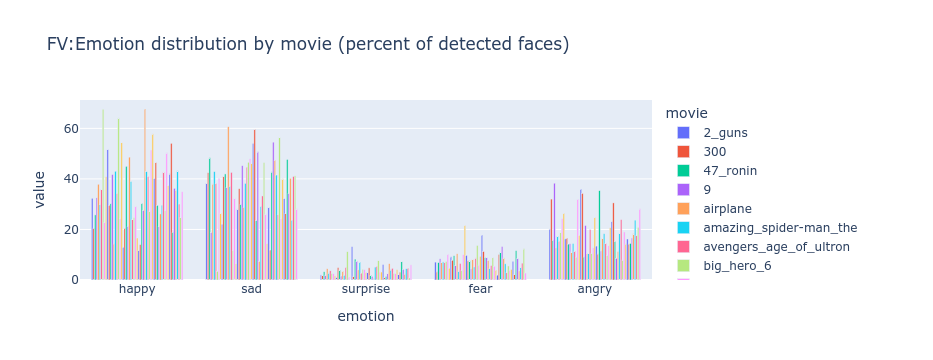

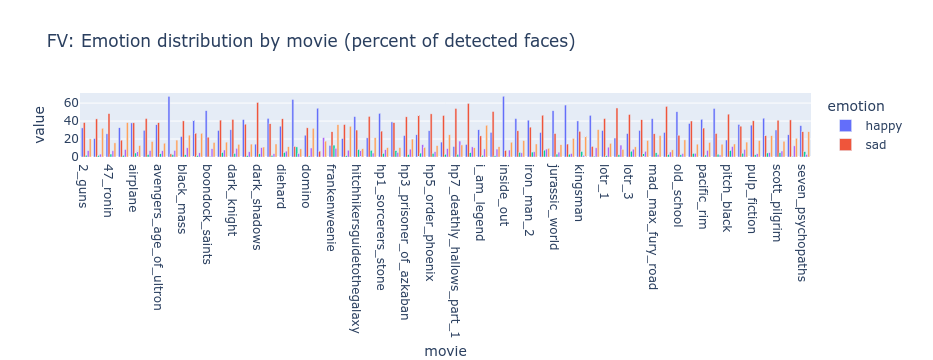

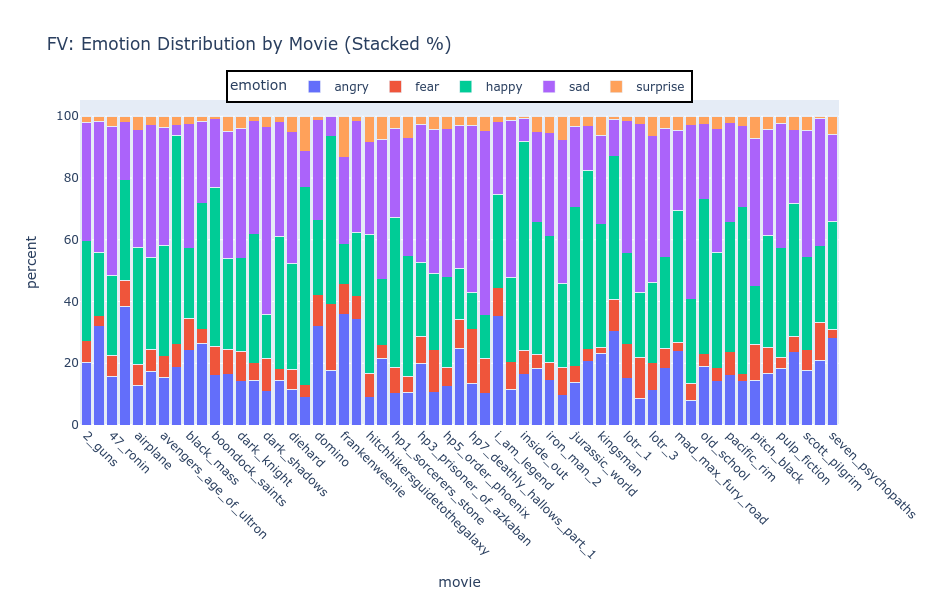

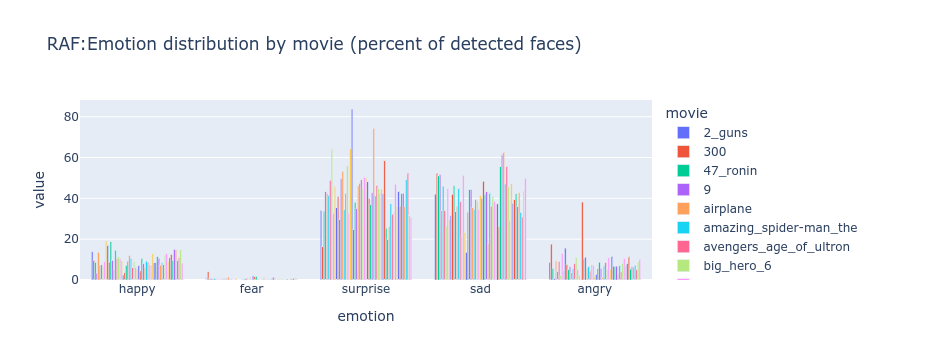

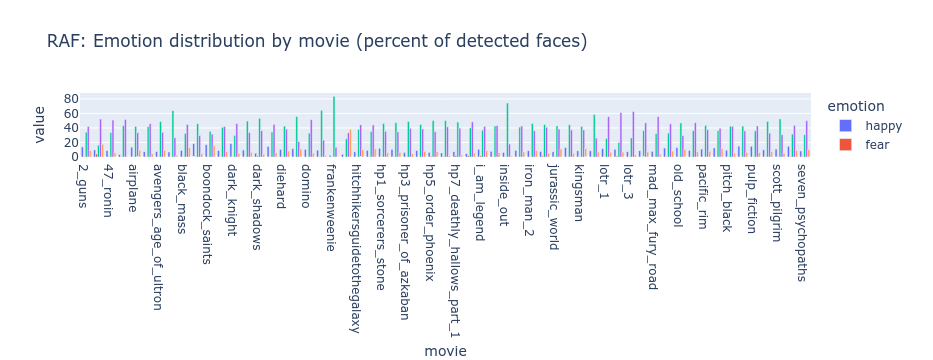

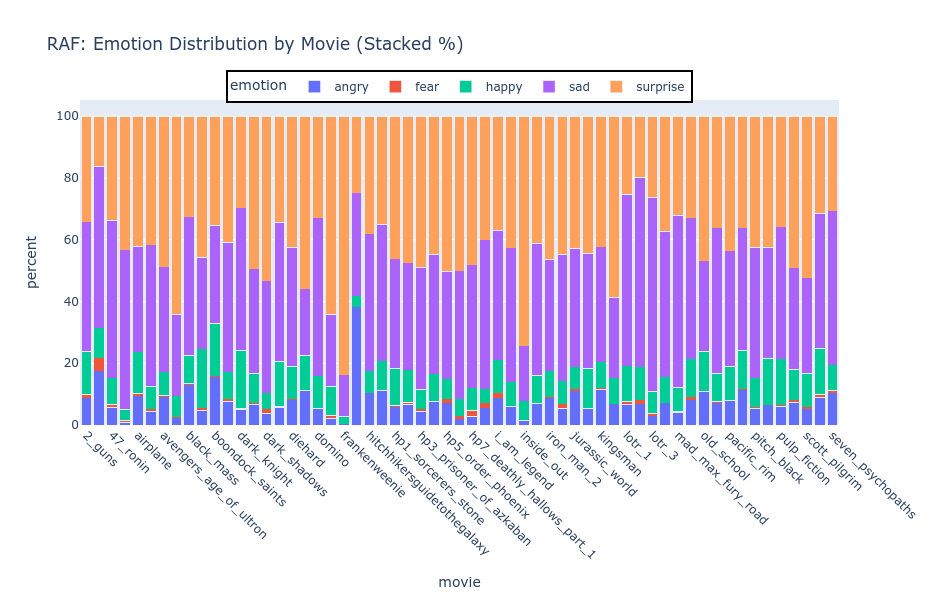

In [22]:
emotion_perc_bar_by_emotion(movie_emotion_summary_dfs, save_path=save_path)

In [23]:
def qa_visuals(df_dict, save_path=None):
    for name, df  in df_dict.items():
        pd_df = df.to_pandas()
        pd_df.sort_values(by=["movie"], inplace=True)

        fig = px.box(
            pd_df,
            x='emotion',
            y='confidence',
            title=f"{name.upper()}: Emotion Prediction Confidence by Class",
            color='emotion'
        )
        
        if save_path:
            save_name = f"{name.upper()}_pred_conf_by_emo.png"
            fig.write_image(save_path / save_name)
        fig.show()
        
        fig = px.box(
            pd_df,
            x='movie',
            y='relative_face_area',
            title=f"{name.upper()}: Face Size Distribution by Movie",
            log_y=True
        )
        if save_path:
            save_name = f"{name.upper()}_face_size_by_movie.png"
            fig.write_image(save_path / save_name)
        fig.show()

        fig = px.box(
            pd_df,
            x='emotion',
            y='relative_face_area',
            title=f'{name.upper()}: Face Size Distribution by Emotion',
            log_y=True 
        )
        
        if save_path:
            save_name = f"{name.upper()}_face_size_by_emotion.png"
            fig.write_image(save_path / save_name)
        fig.show()

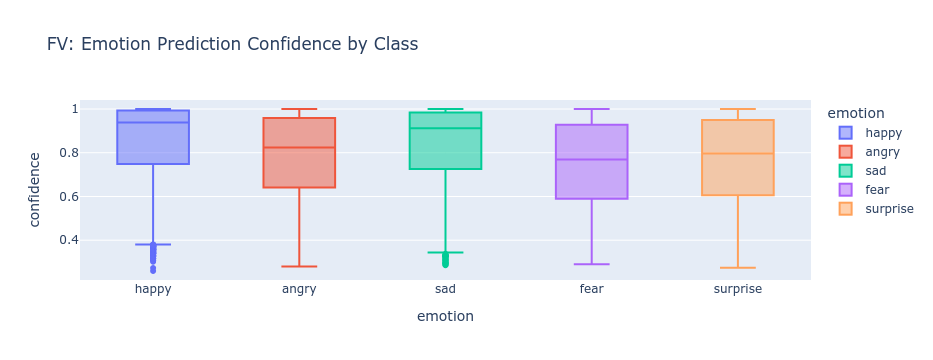

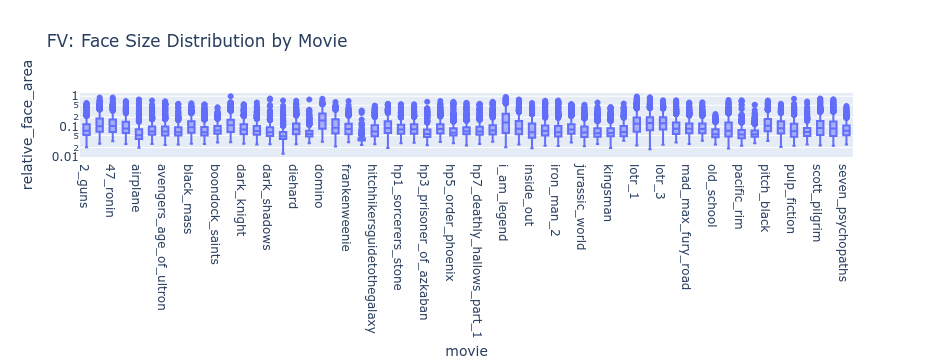

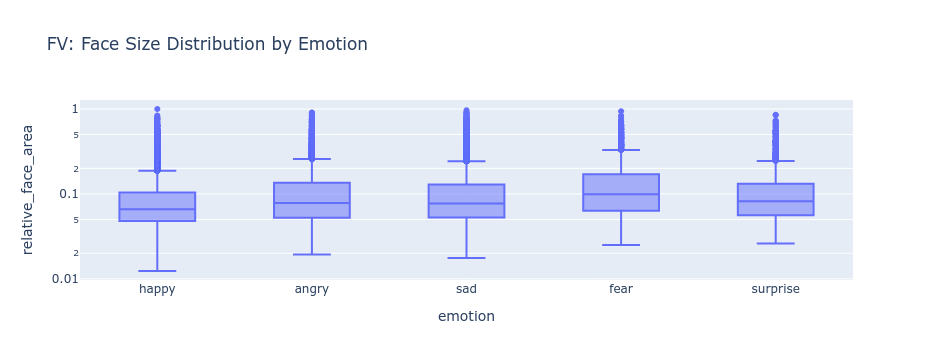

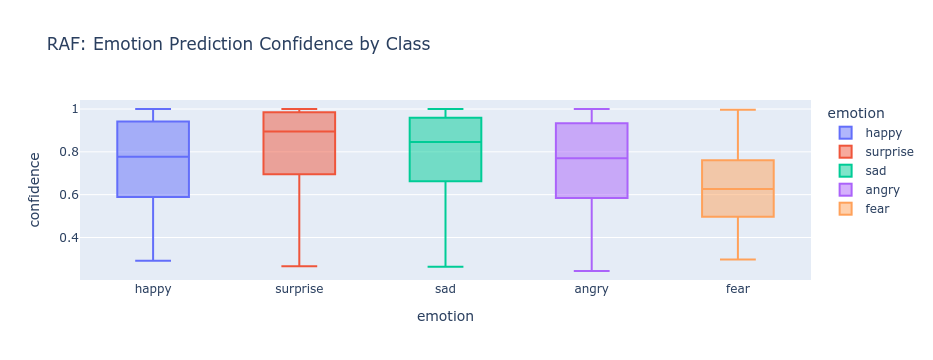

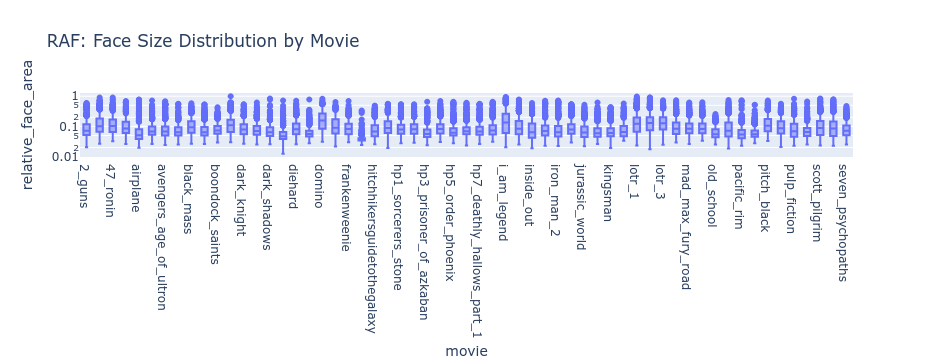

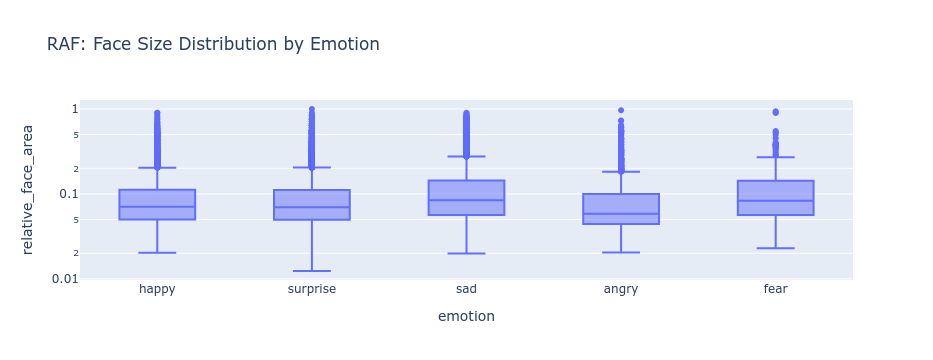

In [24]:
qa_visuals(movie_dfs, save_path=save_path)

## Movie Timeline Analysis

In [25]:
def plot_emotion_timeline(df, movie_name, confidence_threshold=0.5):
    """
    Plot cumulative emotion counts over movie runtime.
    """
    # Get movie data
    movie_df = (
        df
        .filter(pl.col("movie") == movie_name)
        .filter(pl.col("confidence") >= confidence_threshold)
        .sort("timestamp_sec")
    )
    
    if len(movie_df) == 0:
        print(f"No data for {movie_name}")
        return None
    
    # Create cumulative counts
    emotions = ["angry", "fear", "happy", "sad", "surprise"]
    
    # Initialize cumulative counters
    timeline_data = []
    cumulative = {e: 0 for e in emotions}
    
    for row in movie_df.iter_rows(named=True):
        # Increment the detected emotion
        cumulative[row["emotion"]] += 1
        
        # Record state at this timestamp
        timeline_data.append({
            "timestamp_sec": row["timestamp_sec"],
            "timestamp_min": row["timestamp_sec"] / 60,
            **{f"{e}_count": cumulative[e] for e in emotions}
        })
    
    timeline_df = pl.DataFrame(timeline_data)
    
    # Convert to pandas for plotly
    timeline_pd = timeline_df.to_pandas()
    
    # Create line plot
    fig = go.Figure()
    
    colors = {
        "angry": "#e74c3c",
        "fear": "#9b59b6", 
        "happy": "#f39c12",
        "sad": "#3498db",
        "surprise": "#1abc9c"
    }
    
    for emotion in emotions:
        fig.add_trace(go.Scatter(
            x=timeline_pd["timestamp_min"],
            y=timeline_pd[f"{emotion}_count"],
            mode="lines",
            name=emotion,
            line=dict(color=colors[emotion], width=2),
        ))
    
    fig.update_layout(
        title=f"Emotion Timeline: {movie_name} (confidence ≥ {confidence_threshold})",
        xaxis_title="Time (minutes)",
        yaxis_title="Cumulative Face Count",
        hovermode="x unified",
        height=500,
    )
    
    return fig

In [26]:
def timeline_multiple_models(df_dict, movie_title, save_path=None):
    for name, df in df_dict.items():
        print(name)
        fig = plot_emotion_timeline(df, movie_title, confidence_threshold=0.5)
        if save_path:
            out_name = save_path / f"{name}_timeplot_{movie_title}.png"    
            fig.write_image(out_name)
        fig.show()


In [27]:
all_titles = movie_dfs['fv']['movie'].unique().to_list()

In [28]:
all_titles.sort()
all_titles

['2_guns',
 '300',
 '47_ronin',
 '9',
 'airplane',
 'amazing_spider-man_the',
 'avengers_age_of_ultron',
 'big_hero_6',
 'black_mass',
 'blackkklansman',
 'boondock_saints',
 'chronicles_of_riddick',
 'dark_knight',
 'dark_knight_rises',
 'dark_shadows',
 'dazed_and_confused',
 'diehard',
 'dodgeball',
 'domino',
 'finding_nemo',
 'frankenweenie',
 'gaffigan_kingbaby',
 'hitchhikersguidetothegalaxy',
 'hot_fuzz',
 'hp1_sorcerers_stone',
 'hp2_chamber_of_secrets',
 'hp3_prisoner_of_azkaban',
 'hp4_goblet_of_fire',
 'hp5_order_phoenix',
 'hp6_half_blood_prince',
 'hp7_deathly_hallows_part_1',
 'hp7_deathly_hallows_part_2',
 'i_am_legend',
 'inception',
 'inside_out',
 'iron_man',
 'iron_man_2',
 'iron_man_3',
 'jurassic_world',
 'kick_ass',
 'kingsman',
 'lego_movie',
 'lotr_1',
 'lotr_2',
 'lotr_3',
 'lucky_number_slevin',
 'mad_max_fury_road',
 'mad_max_thunderdome',
 'old_school',
 'once_upon_a_time_in_mexico_t00',
 'pacific_rim',
 'pineapple_exp',
 'pitch_black',
 'point_break',
 'pu

fv


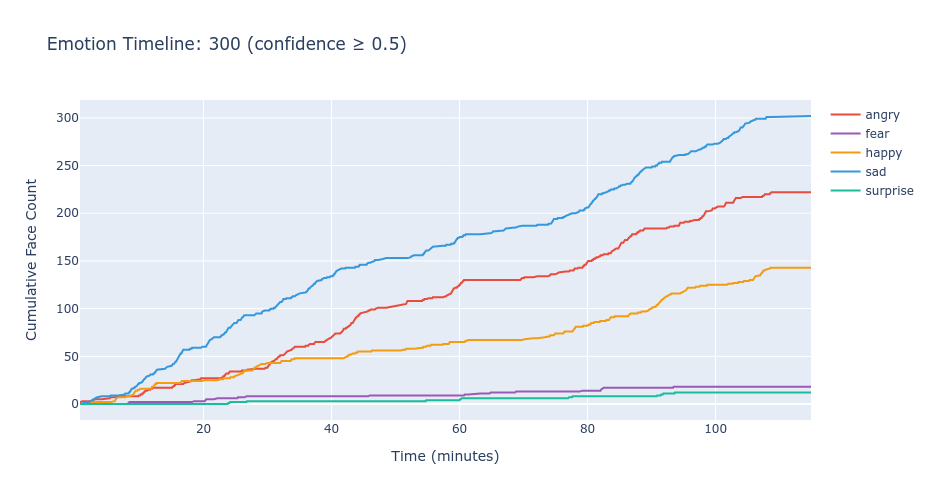

raf


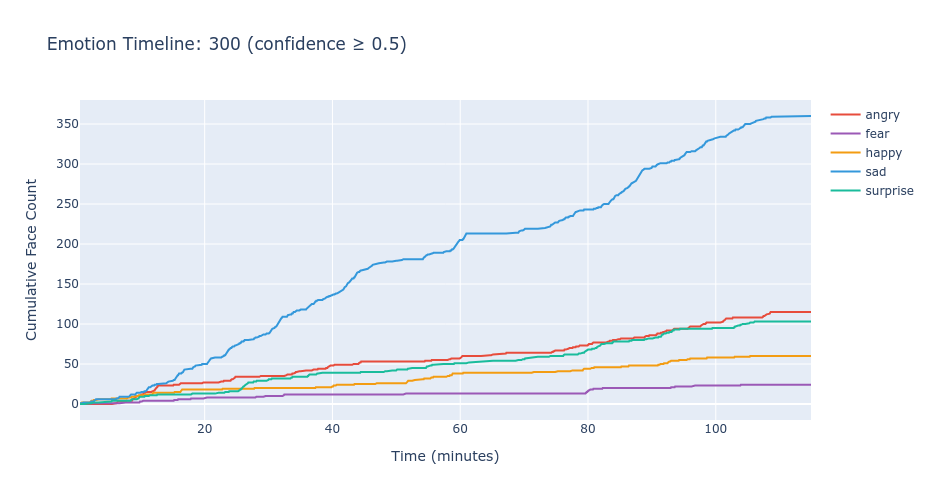

In [29]:
timeline_multiple_models(movie_dfs, "300", save_path=save_path)

fv


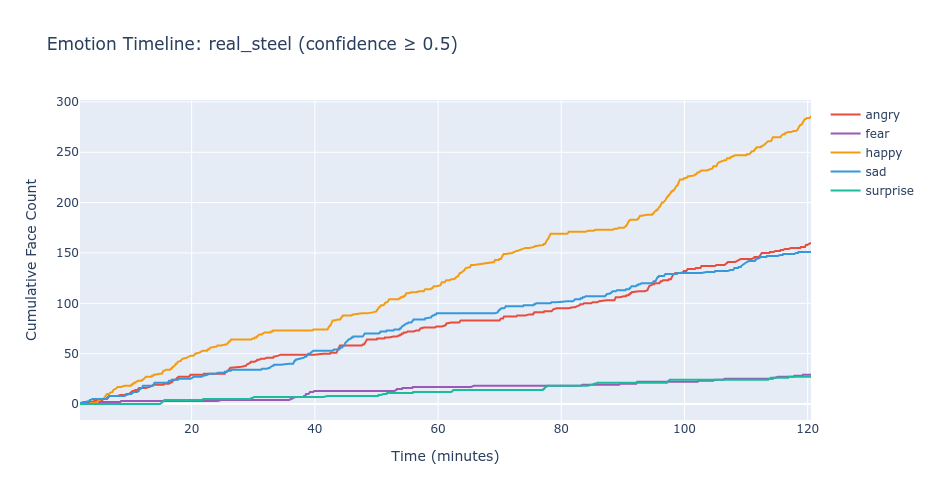

raf


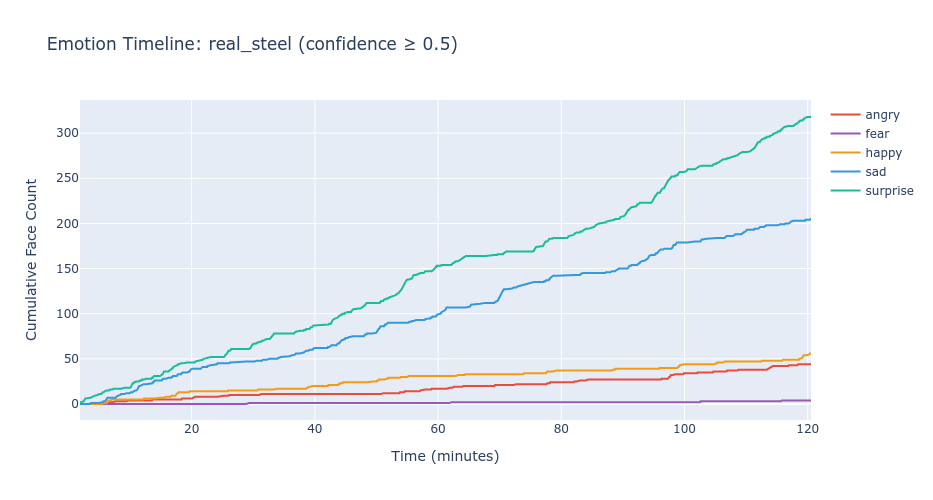

In [30]:
timeline_multiple_models(movie_dfs, "real_steel", save_path=save_path)

fv


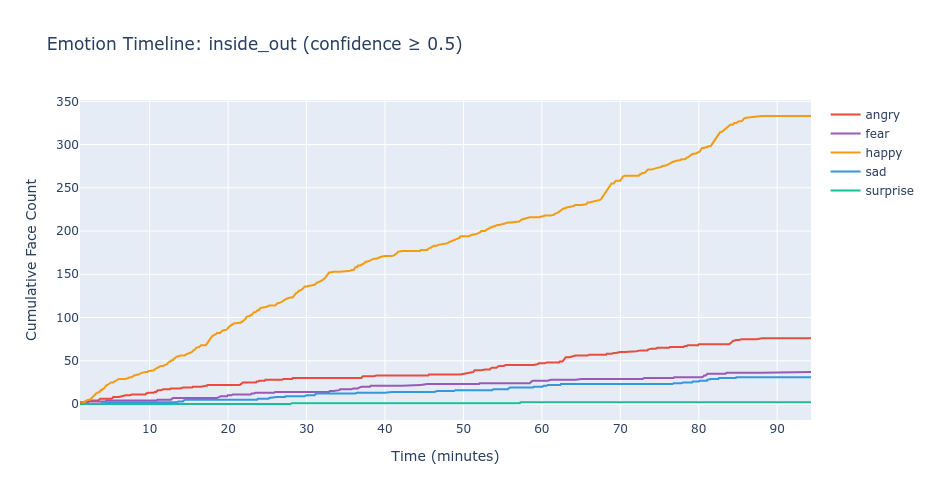

raf


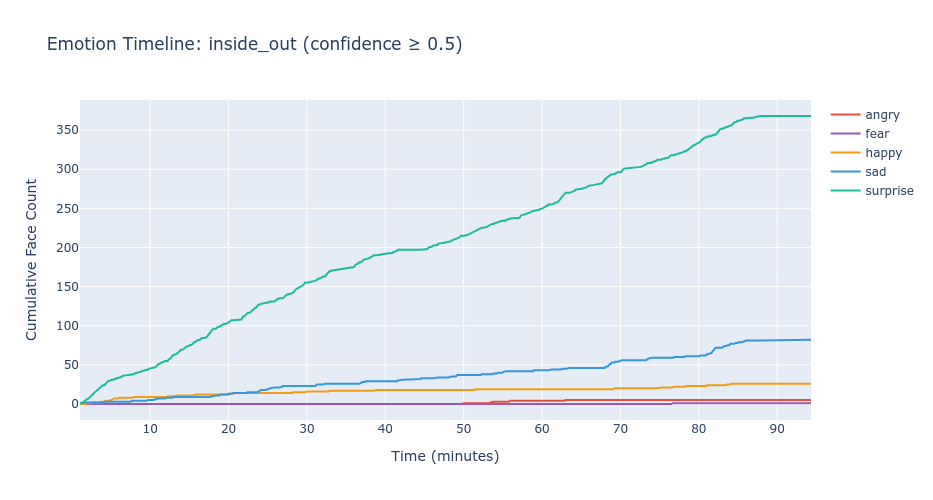

In [31]:
timeline_multiple_models(movie_dfs, "inside_out", save_path=save_path)

fv


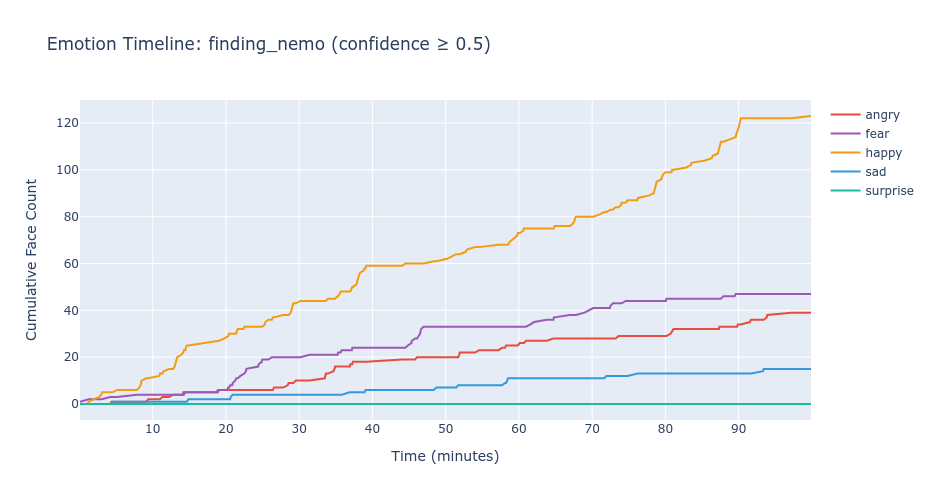

raf


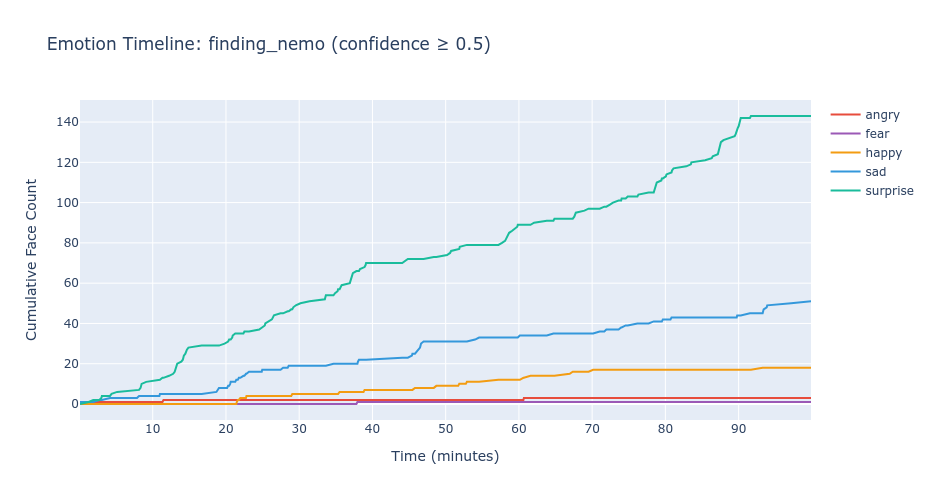

In [32]:
timeline_multiple_models(movie_dfs, "finding_nemo", save_path=save_path)